In [1]:
import numpy as np
from matplotlib import pyplot as plt
import time

from PIL import Image
import cv2

import torch
import torchvision
from torch.utils.data import Dataset, DataLoader, random_split
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms as tfs
torch.manual_seed(42)
import albumentations as A
from albumentations.pytorch import ToTensorV2

from glob import glob

from sklearn.model_selection import train_test_split

import multiprocessing as mp 
from multiprocessing import freeze_support


In [2]:
X = []
X.extend(glob('./data/train/*.png'))
X.extend(glob('./data/train/*.jpg'))
DATA_PATH_TRAIN_LIST, DATA_PATH_TEST_LIST = train_test_split(X,
                                                            test_size=0.1, 
                                                            random_state=42)

print(len(DATA_PATH_TRAIN_LIST))
print(len(DATA_PATH_TEST_LIST))

10753
1195


In [3]:
class TrainImageTransform(): 
    def __init__(self):
        self.im_aug = tfs.Compose([
            tfs.Resize(256),
            tfs.CenterCrop(128),
            # tfs.RandomPerspective(), # 실험5. 입체방향 각도의 인식(param부터 다시 얻어와야할듯)
            # tfs.RandomRotation(360),
            tfs.RandomGrayscale(p=1),
            tfs.ColorJitter(brightness=0.5, contrast=0.5, hue=0.5)
            ])

        self.im_tensor = tfs.Compose([
            tfs.ToTensor(),
            tfs.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
            ])

        # self.degree = np.random.randint(360) # 실험1. iter에 같은 degree 

    def __call__(self, img):
        degree = np.random.randint(360) # 실험2. iter에 다른 degree
        x = img.rotate(degree)
        x = self.im_aug(x)
        x = self.im_tensor(x)
        return x, degree

In [4]:
class TestImageTransform():
    
    def __init__(self):
        self.im_aug = tfs.Compose([
            tfs.Resize(256),
            tfs.CenterCrop(128)
            # tfs.RandomPerspective() # 실험3. 성능의 차이를 보자 !
            ])

        self.im_tensor = tfs.Compose([
            tfs.ToTensor(),
            tfs.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
            ])

        # self.degree = np.random.randint(360) # 실험1. iter에 같은 degree 

    def __call__(self, img):
        degree = np.random.randint(360) # 실험2. iter에 다른 degree
        x = img.rotate(degree)
        x = self.im_aug(x)
        x = self.im_tensor(x)
        return x, degree

In [5]:
class Img_Dataset(Dataset):
    
    def __init__(self, file_list, transform):
        self.file_list = file_list
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, index):
        img_path = self.file_list[index]
        img = Image.open(img_path).convert('RGB') # 픽셀당 추가 알파 채널이 있다고 생각 하므로 채널이 3개가 아닌 4개입니다.
        img_transformed, angle = self.transform(img)

        # partition = {
        #     'img' : img,
        #     'tensor' : img_transformed,
        #     'angle' : angle
        # }

        return img_transformed, angle

In [6]:
train_val_dataset = Img_Dataset(file_list=DATA_PATH_TRAIN_LIST,
                    transform=TrainImageTransform())
print(len(train_val_dataset))
train_dataset, val_dataset = random_split(train_val_dataset, [9000, 1753])

test_dataset = Img_Dataset(file_list=DATA_PATH_TEST_LIST,
                        transform=TestImageTransform())

10753


# Albumentations (Each Data)

In [7]:
# class TrainDataset(Dataset):
#     def __init__(self, file_paths):
#         self.file_paths = file_paths

#         self.im_aug =  A.Compose([
#             A.CenterCrop(128, 128),
#             A.ToGray(p=0.6),
#             A.ColorJitter (brightness=0.2, contrast=0.2, saturation=0.2, 
#                             hue=0.2, always_apply=False, p=0.6
#                             ),
#             A.Normalize(
#                 mean=[0.5, 0.5, 0.5],
#                 std=[0.5, 0.5, 0.5]
#                 ),
#             ToTensorV2()
#         ])

#     def __len__(self):
#         return len(self.file_paths)

#     def __getitem__(self, idx):
#         file_paths = self.file_paths[idx]

#         image = cv2.imread(file_paths)
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

#         degree = np.random.randint(359)
#         al_rotate = A.Compose([
#                         A.Resize(256, 256), 
#                         A.Rotate((degree, degree), p=1.0)
#         ])
#         image = al_rotate(image=image)
#         image = image['image']

#         augmented = self.im_aug(image=image)
#         image = augmented['image']

#         return image, degree

# class TestDataset(Dataset):
#     def __init__(self, file_paths):
#         self.file_paths = file_paths

#         self.im_aug =  A.Compose([
#                 A.CenterCrop(128, 128), ##########
#                 A.Normalize(
#                     mean=[0.5, 0.5, 0.5],
#                     std=[0.5, 0.5, 0.5]
#                     ),
#                 ToTensorV2()
#         ])

#     def __len__(self):
#         return len(self.file_paths)

#     def __getitem__(self, idx):
#         file_paths = self.file_paths[idx]

#         image = cv2.imread(file_paths)
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

#         degree = np.random.randint(359)
#         al_rotate = A.Compose([
#                         A.Resize(256, 256), 
#                         A.Rotate((degree, degree), p=1.0)
#         ])
#         image = al_rotate(image=image)
#         image = image['image']

#         augmented = self.im_aug(image=image)
#         image = augmented['image']

#         return image, degree

# train_val_dataset = TrainDataset(file_paths=DATA_PATH_TRAIN_LIST)

# train_dataset, val_dataset = random_split(train_val_dataset, [9000, 1753])

# test_dataset = TestDataset(file_paths=DATA_PATH_TEST_LIST)

In [8]:
partition = {'train': train_dataset, 'val':val_dataset, 'test':test_dataset}

In [9]:
cfg = {
    'VGG11': [64, 'M', 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M'],
    'VGG13': [64, 64, 'M', 128, 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M'],
    'VGG16': [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 'M', 512, 512, 512, 'M', 512, 512, 512, 'M'],
    'VGG1M16': [64, 64, 'M', 128, 128, 'M', 256, 256, 'M', 512, 512, 512, 'M', 1024, 1024, 'M', 1024, 1024, 'M'],
}

In [10]:
class CNN(nn.Module):
    
    def __init__(self, model_code, in_channels, out_dim, act, use_bn):
        super(CNN, self).__init__()
        
        if act == 'relu':
            self.act = nn.ReLU()
        elif act == 'sigmoid':
            self.act = nn.Sigmoid()
        elif act == 'tanh':
            self.act = nn.TanH()
        else:
            raise ValueError("Not a valid activation function code")
        
        self.layers = self._make_layers(model_code, in_channels, use_bn)
        self.classifer = nn.Sequential(nn.Linear(8192, 1024),
                                       self.act,
                                       nn.Linear(1024, out_dim))
        
    def forward(self, x):
        x = self.layers(x)
        x = x.view(x.size(0), -1)
        x = self.classifer(x)
        return x
        
    def _make_layers(self, model_code, in_channels, use_bn):
        layers = []
        for x in cfg[model_code]:
            if x == 'M':
                layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
            else:
                layers += [nn.Conv2d(in_channels=in_channels,
                                     out_channels=x,
                                     kernel_size=3,
                                     stride=1,
                                     padding=1)]
                if use_bn:
                    layers += [nn.BatchNorm2d(x)]
                layers += [self.act]
                in_channels = x
        return nn.Sequential(*layers)

In [11]:
def train(net, partition, optimizer, criterion, args):
    trainloader = DataLoader(partition['train'], 
                            batch_size=args.train_batch_size, 
                            shuffle=True) # , persistent_workers=True, num_workers=4)
    net.train()

    correct = 0
    total = 0
    train_loss = 0.0

    for i, data in enumerate(trainloader, 0):
        optimizer.zero_grad() 

        # get the inputs
        inputs, labels = data
        inputs = inputs.cuda()
        labels = labels.cuda()
        outputs = net(inputs)

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss = train_loss / len(trainloader)
    train_acc = 100 * correct / total
    return net, train_loss, train_acc

In [12]:
def validate(net, partition, criterion, args):
    valloader = DataLoader(partition['val'], 
                            batch_size=args.test_batch_size, 
                            shuffle=False) # , persistent_workers=True, num_workers=4)
    net.eval()

    correct = 0
    total = 0
    val_loss = 0 
    with torch.no_grad():
        for data in valloader:
            images, labels = data
            images = images.cuda()
            labels = labels.cuda()
            outputs = net(images)

            loss = criterion(outputs, labels)
            
            val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        val_loss = val_loss / len(valloader)
        val_acc = 100 * correct / total
    return val_loss, val_acc

In [13]:
def test(net, partition, args):
    testloader = DataLoader(partition['test'], 
                            batch_size=args.test_batch_size, 
                            shuffle=False) # , persistent_workers=True, num_workers=4)
    net.eval()
    
    correct = 0
    total = 0
    current_labels = []
    current_preds = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.cuda()
            labels = labels.cuda()

            outputs = net(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            current_labels.extend(labels)
            current_preds.extend(predicted)

        test_acc = 100 * correct / total
    return test_acc, current_labels, current_preds

In [14]:
def experiment(partition, args):
      
    net = CNN(model_code = args.model_code,
              in_channels = args.in_channels,
              out_dim = args.out_dim,
              act = args.act,
              use_bn = args.use_bn)
    net.cuda()

    criterion = nn.CrossEntropyLoss()
    if args.optim == 'SGD':
        optimizer = optim.SGD(net.parameters(), lr=args.lr, weight_decay=args.l2)
    elif args.optim == 'RMSprop':
        optimizer = optim.RMSprop(net.parameters(), lr=args.lr, weight_decay=args.l2)
    elif args.optim == 'Adam':
        optimizer = optim.Adam(net.parameters(), lr=args.lr, weight_decay=args.l2)
    else:
        raise ValueError('In-valid optimizer choice')
    
    train_losses = []
    val_losses = []
    train_accs = []
    val_accs = []

    min_val_loss = np.Inf
    n_epochs_stop = 6
    epochs_no_improve = 0
    early_stop = False
    iter = 0

    for epoch in range(args.epoch):  # loop over the dataset multiple times
        ts = time.time()
        net, train_loss, train_acc = train(net, partition, optimizer, criterion, args)
        val_loss, val_acc = validate(net, partition, criterion, args)
        te = time.time()
        
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        train_accs.append(train_acc)
        val_accs.append(val_acc)
        
        print('Epoch {}, Acc(train/val): {:2.2f}/{:2.2f}, Loss(train/val) {:2.2f}/{:2.2f}. Took {:2.2f} sec'.format(epoch, train_acc, val_acc, train_loss, val_loss, te-ts))
        
        if val_loss < min_val_loss:
        # Save the model
            save_model_path = f'./{str(args.lr).split(".")[1]}-{args.model_code[3:]}-{args.epoch}.pt'
            torch.save(net.state_dict(), save_model_path) 
            epochs_no_improve = 0
            min_val_loss = val_loss
  
        else:
            epochs_no_improve += 1
        iter += 1
        if epoch > 5 and epochs_no_improve == n_epochs_stop:
            print('Early stopping!' )
            early_stop = True
            break
        else:
            continue

    test_acc, current_labels, current_preds = test(net, partition, args)    
    
    result = {}
    result['train_losses'] = train_losses
    result['val_losses'] = val_losses
    result['train_accs'] = train_accs
    result['val_accs'] = val_accs
    result['train_acc'] = train_acc
    result['val_acc'] = val_acc
    result['test_acc'] = test_acc

    result['test_labels'] = current_labels
    result['test_preds'] = current_preds

    return vars(args), result

In [15]:
import hashlib
import json
from os import listdir
from os.path import isfile, join
import pandas as pd

!mkdir results

def save_exp_result(setting, result):
    exp_name = setting['exp_name']
    del setting['epoch']
    del setting['test_batch_size']

    hash_key = hashlib.sha1(str(setting).encode()).hexdigest()[:6]
    save_model_path = f'{str(args.lr).split(".")[1]}-{args.model_code[3:]}-{args.epoch}'
    filename = './results/{}-{}-{}.json'.format(exp_name, hash_key, save_model_path)
    result.update(setting)
    with open(filename, 'w') as f:
        json.dump(result, f)

    
def load_exp_result(exp_name):
    dir_path = './results'
    filenames = [f for f in listdir(dir_path) if isfile(join(dir_path, f)) if '.json' in f]
    list_result = []
    for filename in filenames:
        if exp_name in filename:
            with open(join(dir_path, filename), 'r') as infile:
                results = json.load(infile)
                list_result.append(results)
    df = pd.DataFrame(list_result) # .drop(columns=[])
    return df

���� ���͸� �Ǵ� ���� results��(��) �̹� �ֽ��ϴ�.


In [16]:
import seaborn as sns
import argparse
from copy import deepcopy

In [17]:
# ====== Random seed Initialization ====== #
seed = 123
np.random.seed(seed)
torch.manual_seed(seed)

parser = argparse.ArgumentParser()
args = parser.parse_args("")
args.exp_name = "exp1_lr_model_code"

# ====== Model ====== #
args.model_code = 'VGG13'
args.in_channels = 3
args.out_dim = 360
args.act = 'relu'

# ====== Regularization ======= #
args.l2 = 0.00001
args.use_bn = True

# ====== Optimizer & Training ====== #
args.optim = 'Adam' #'RMSprop' #SGD, RMSprop, ADAM...
args.lr = 0.0001
args.epoch = 100

args.train_batch_size = 64
args.test_batch_size = 64

# print(args)   
# setting, result = experiment(partition, deepcopy(args))
# save_exp_result(setting, result)

In [18]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

model = CNN('VGG13', 3, 360, 'relu', True)
model.cuda()

model.load_state_dict(torch.load('128-0001-13-177-7690.pt'))

<All keys matched successfully>

In [19]:
if __name__ == '__main__':
    mp.freeze_support()
    test_acc, current_labels, current_preds = test(model, partition, args)    

result_test = {}
result_test['test_acc'] = test_acc
result_test['test_labels'] = current_labels
result_test['test_preds'] = current_preds

In [38]:
len(result_test['test_preds'])

1195

In [20]:
result_test['test_acc']

82.00836820083683

In [21]:
right = 0
count_0 = 0
count_180 = 0
count = 0
miss = []
for i, l in enumerate(result_test['test_labels']):    
    # if l != result_test['test_preds'][i]:
    k = l - result_test['test_preds'][i]
    if k.item() == 0:
        right += 1
    elif abs(k.item()) < 4:
        count_0 += 1
    elif abs(k.item()) > 176 and abs(k.item()) < 184:
        count_180 += 1
    else :
        count += 1
        miss.append(k.item())

print('전체 개수', len(result_test['test_labels']))
print('정확도', right)
print('3도 이내 오차', count_0)
print('180 오차', count_180)
print('완전 오차', count)
print(miss)

전체 개수 1195
정확도 980
3도 이내 오차 179
180 오차 21
완전 오차 15
[100, -335, 8, 79, -212, 7, -19, -4, 5, 15, 267, 49, -38, -58, -161]


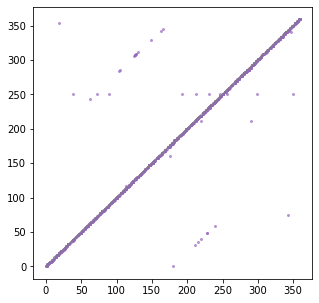

In [22]:
la = []
pr = []
for i, l in enumerate(result_test['test_labels']):
    p = result_test['test_preds'][i]
    la.append(l.item())
    pr.append(p.item())
plt.figure(figsize=(5,5))
plt.scatter(la, pr, s=4, c='#9467bd', alpha=0.6)
plt.plot(la, la, c='#7f7f7f', alpha=0.6)

In [23]:
class SubImageTransform():
    
    def __init__(self):
        self.im_aug = tfs.Compose([
            tfs.Resize(256),
            tfs.CenterCrop(128)
            # tfs.RandomPerspective() # 실험3. 성능의 차이를 보자 !
            ])

        self.im_tensor = tfs.Compose([
            tfs.ToTensor(),
            tfs.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
            ])

    def __call__(self, img):
        
        degree = np.random.randint(360) # 실험2. iter에 다른 degree
        x = img.rotate(degree)
        x = self.im_aug(x)
        x = self.im_tensor(x)
        return x, degree

In [24]:
class Sub_Img_Dataset(Dataset):
    
    def __init__(self, file_list, transform):
        self.file_list = file_list
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, index):
        img_path = self.file_list[index]
        img = Image.open(img_path).convert('RGB') # 픽셀당 추가 알파 채널이 있다고 생각 하므로 채널이 3개가 아닌 4개입니다.
        img_transformed, angle = self.transform(img)

        return img_transformed, angle, img_path

In [25]:
DATA_PATH_SUB_LIST = []
DATA_PATH_SUB_LIST.extend(glob('./data/test_samples/easyset/*.png'))
DATA_PATH_SUB_LIST.extend(glob('./data/test_samples/easyset/*.jpg'))

sub_dataset = Sub_Img_Dataset(file_list=DATA_PATH_SUB_LIST,
                        transform=SubImageTransform())

sub_dataloader = DataLoader(sub_dataset,
                            batch_size=64)

partition['sub'] = sub_dataloader

In [26]:
def sub(net, partition, args):
    
    net.eval()
    
    correct = 0
    total = 0
    current_labels = []
    current_preds = []
    with torch.no_grad():
        for data in partition['sub']:
            images, labels, img_path = data
            images = images.cuda()
            labels = labels.cuda()

            outputs = net(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            current_labels.extend(labels)
            current_preds.extend(predicted)

        test_acc = 100 * correct / total
    return test_acc, current_labels, current_preds, img_path

In [27]:
def ex_tf(x, d):
    im_aug = tfs.Compose([
        tfs.Resize(256),
        tfs.CenterCrop(128),
        ])
    
    x = x.rotate(d)
    x = im_aug(x)
    return x, d

In [28]:
sub_acc, sub_labels, sub_preds, img_path = sub(model, partition, args)    

result_sub = {}
result_sub['sub_acc'] = sub_acc
result_sub['sub_labels'] = sub_labels
result_sub['sub_preds'] = sub_preds
result_sub['img_path'] = img_path
sub_acc

20.58823529411765

0 // Label : 66 / Pred : 66 / diff : 0


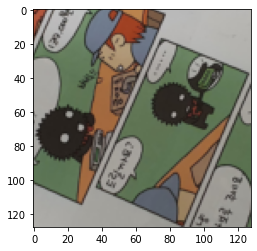

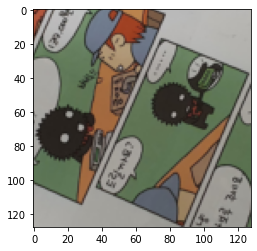

1 // Label : 130 / Pred : 130 / diff : 0


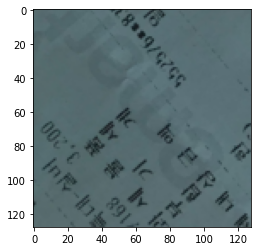

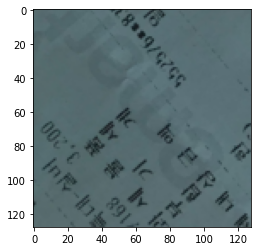

2 // Label : 206 / Pred : 206 / diff : 0


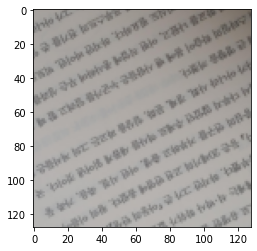

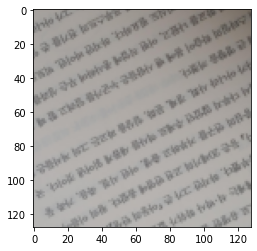

3 // Label : 175 / Pred : 176 / diff : -1


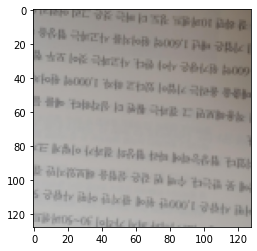

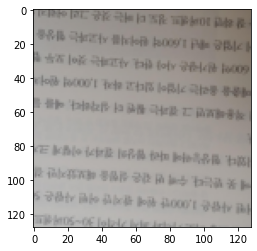

4 // Label : 95 / Pred : 94 / diff : 1


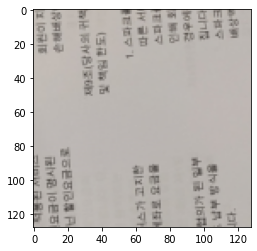

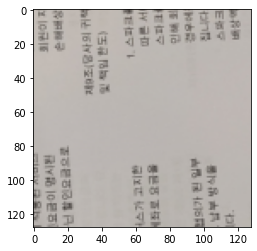

5 // Label : 327 / Pred : 328 / diff : -1


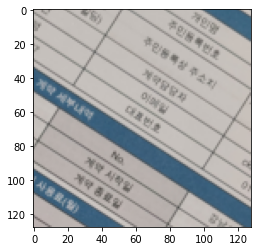

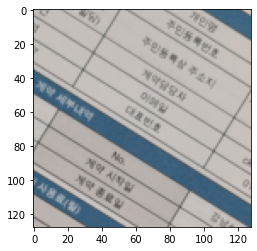

6 // Label : 133 / Pred : 313 / diff : -180


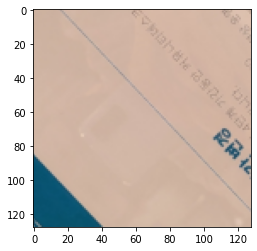

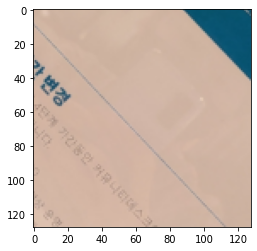

7 // Label : 4 / Pred : 3 / diff : 1


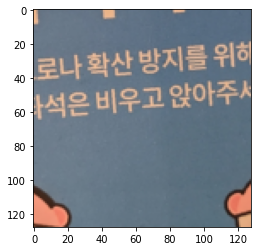

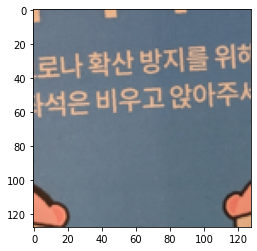

8 // Label : 15 / Pred : 16 / diff : -1


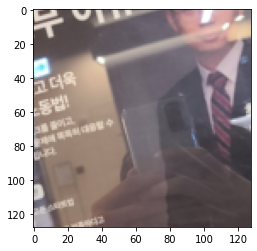

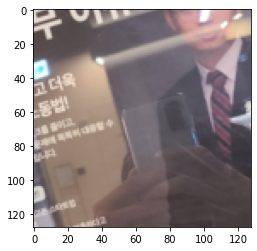

9 // Label : 237 / Pred : 56 / diff : 181


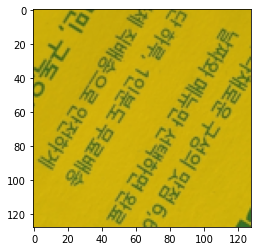

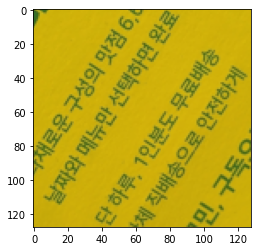

10 // Label : 52 / Pred : 51 / diff : 1


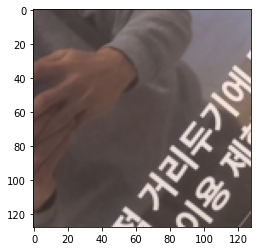

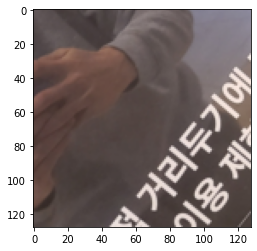

11 // Label : 272 / Pred : 92 / diff : 180


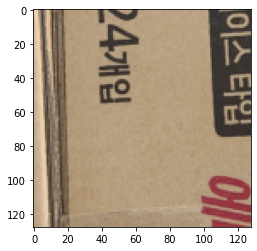

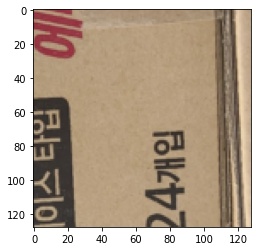

12 // Label : 294 / Pred : 291 / diff : 3


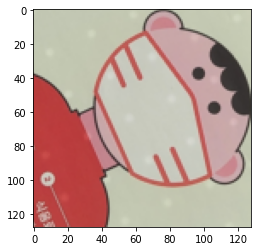

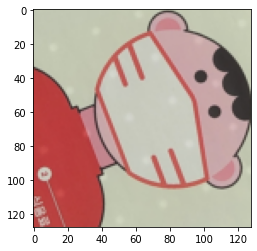

13 // Label : 87 / Pred : 78 / diff : 9


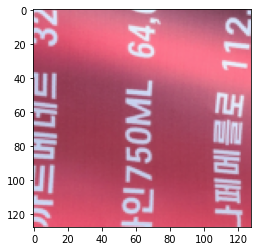

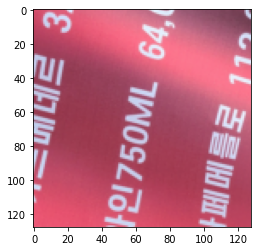

14 // Label : 346 / Pred : 345 / diff : 1


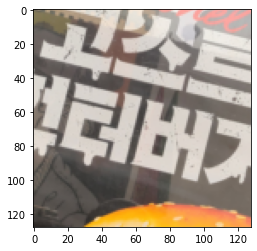

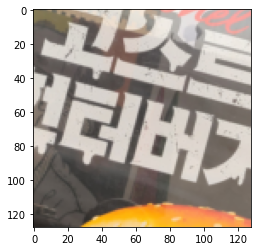

15 // Label : 280 / Pred : 280 / diff : 0


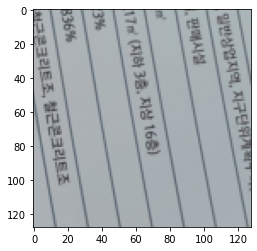

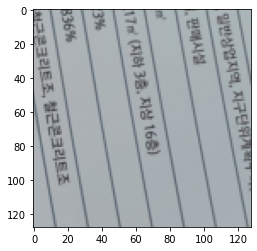

16 // Label : 20 / Pred : 21 / diff : -1


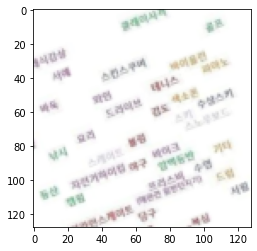

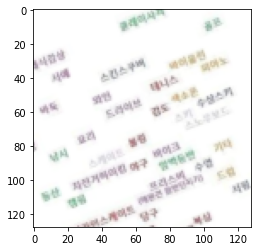

17 // Label : 109 / Pred : 108 / diff : 1


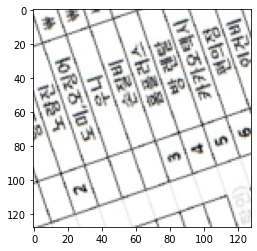

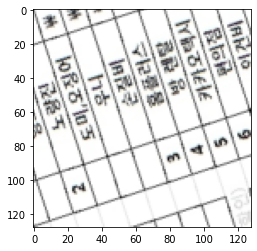

18 // Label : 135 / Pred : 315 / diff : -180


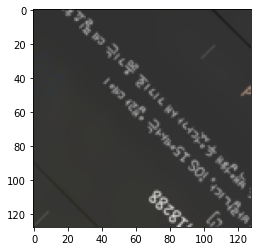

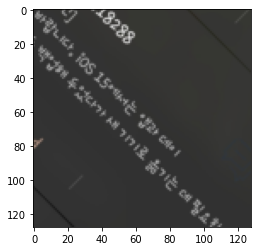

19 // Label : 173 / Pred : 76 / diff : 97


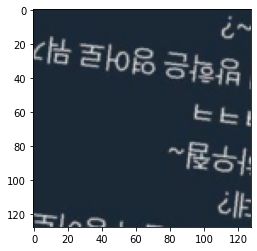

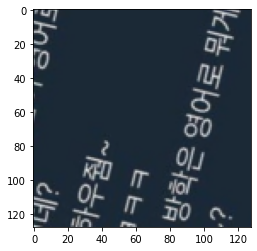

20 // Label : 33 / Pred : 304 / diff : -271


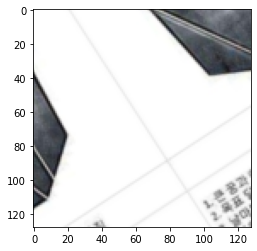

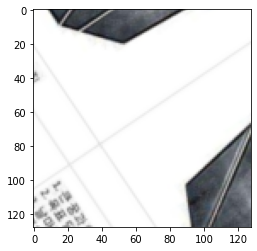

21 // Label : 290 / Pred : 290 / diff : 0


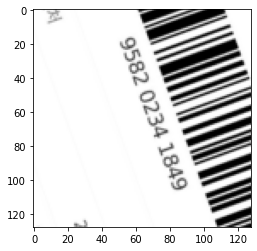

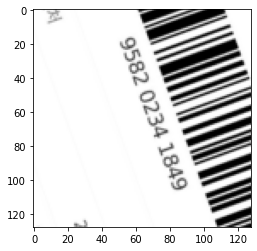

22 // Label : 281 / Pred : 281 / diff : 0


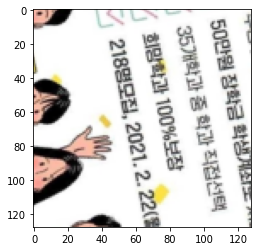

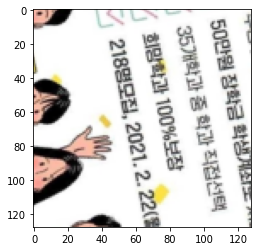

23 // Label : 355 / Pred : 174 / diff : 181


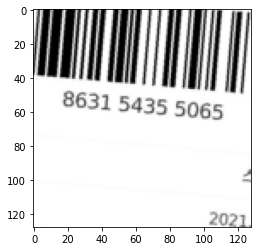

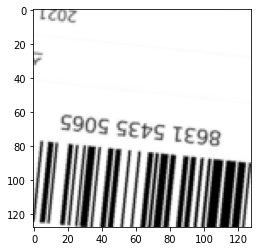

24 // Label : 290 / Pred : 289 / diff : 1


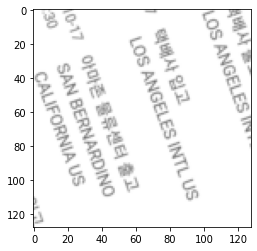

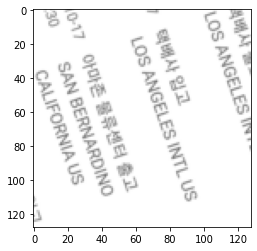

25 // Label : 270 / Pred : 270 / diff : 0


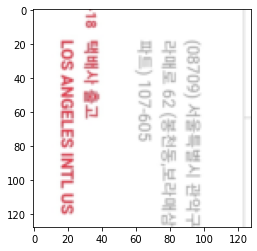

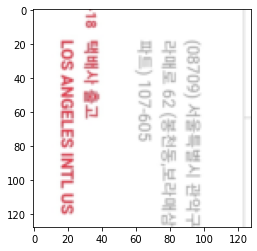

26 // Label : 322 / Pred : 62 / diff : 260


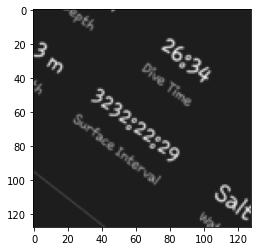

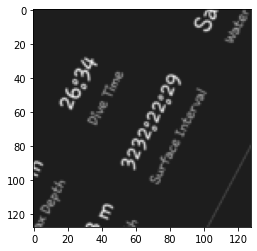

27 // Label : 163 / Pred : 164 / diff : -1


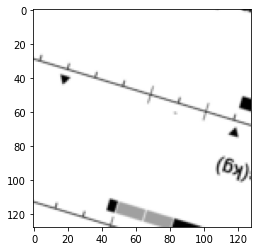

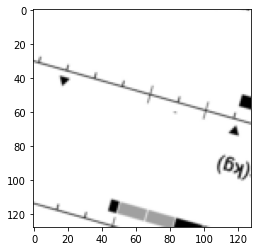

28 // Label : 106 / Pred : 283 / diff : -177


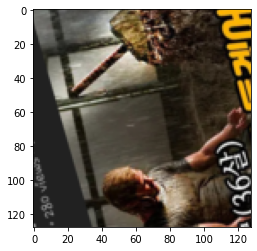

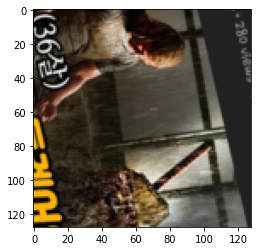

29 // Label : 9 / Pred : 355 / diff : -346


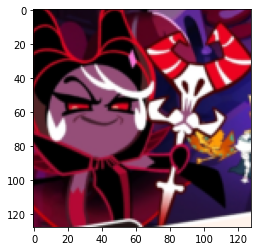

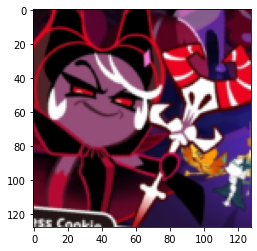

30 // Label : 157 / Pred : 337 / diff : -180


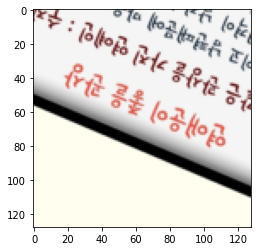

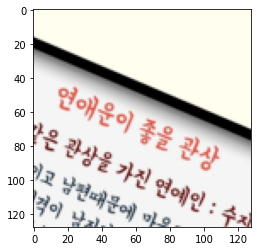

31 // Label : 124 / Pred : 305 / diff : -181


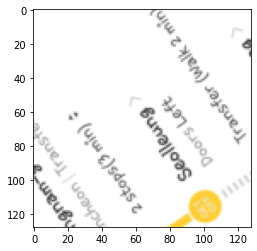

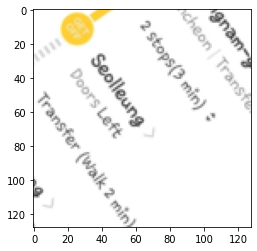

32 // Label : 227 / Pred : 226 / diff : 1


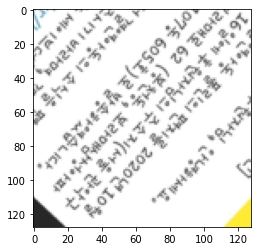

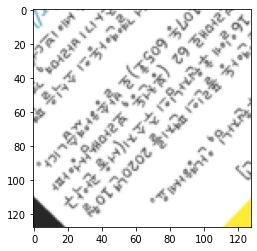

33 // Label : 216 / Pred : 221 / diff : -5


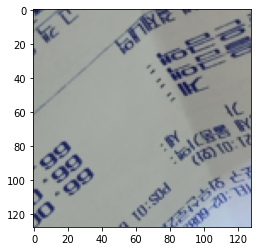

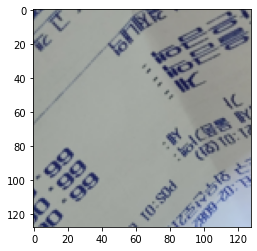

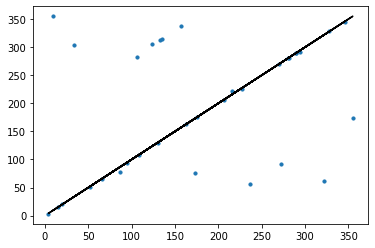

In [29]:
la = []
pr = []
for i, l in enumerate(result_sub['sub_labels']):
    p = result_sub['sub_preds'][i]
    la.append(l.item())
    pr.append(p.item())
    if l != p:
        k = l - p
        print(i, '// Label :', l.item(), '/ Pred :', p.item(), '/ diff :', k.item())
        img, y = ex_tf(Image.open(result_sub['img_path'][i]), l.item())
        # print(y)
        plt.imshow(img)
        plt.show()
        img, y = ex_tf(Image.open(result_sub['img_path'][i]), p.item())
        # print(y)
        plt.imshow(img)
        plt.show()
    else :
        k = l - p
        print(i, '// Label :', l.item(), '/ Pred :', p.item(), '/ diff :', k.item())
        img, y = ex_tf(Image.open(result_sub['img_path'][i]), l.item())
        # print(y)
        plt.imshow(img)
        plt.show()
        img, y = ex_tf(Image.open(result_sub['img_path'][i]), p.item())
        # print(y)
        plt.imshow(img)
        plt.show()
plt.scatter(la, pr, s=10)
plt.plot(la, la, color='black')

In [30]:
count = 0
count_180 = 0
count_f = 0
for i, p in enumerate(pr):
    k = abs(la[i] - p)
    if (k >= -3) and (k <= 3):
        count += 1
    elif (k >= 177) and (k <= 183):
        count_180 += 1
    else :
        count_f += 1
        print(i, '\t', la[i], '\t', p, '\t', k)

print('정산', count, count_180, count_f, count/34)

13 	 87 	 78 	 9
19 	 173 	 76 	 97
20 	 33 	 304 	 271
26 	 322 	 62 	 260
29 	 9 	 355 	 346
33 	 216 	 221 	 5
정산 20 8 6 0.5882352941176471


In [31]:
class ProImageTransform():
    
    def __init__(self):
        self.im_aug = tfs.Compose([
            tfs.Resize(512),
            tfs.CenterCrop(128),
            tfs.ToTensor(),
            tfs.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
            ])

    def __call__(self, img):

        x = self.im_aug(img)
        return x

In [32]:
class Pro_Img_Dataset(Dataset):
    
    def __init__(self, file_list, transform):
        self.file_list = file_list
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, index):
        img_path = self.file_list[index]
        img = Image.open(img_path).convert('RGB') # 픽셀당 추가 알파 채널이 있다고 생각 하므로 채널이 3개가 아닌 4개입니다.
        img_transformed = self.transform(img)

        return img_transformed, img_path

In [33]:
DATA_PATH_PRO_LIST = []
DATA_PATH_PRO_LIST.extend(glob('./data/test_samples/pro/*.png'))
DATA_PATH_PRO_LIST.extend(glob('./data/test_samples/pro/*.jpg'))
pro_dataset = Pro_Img_Dataset(file_list=DATA_PATH_PRO_LIST,
                        transform=ProImageTransform())

pro_dataloader = DataLoader(pro_dataset,
                            batch_size=64)

partition['pro'] = pro_dataloader

In [34]:
def pro(net, partition, args):
    
    net.eval()
    
    current_preds = []
    with torch.no_grad():
        for data in partition['pro']:
            images, img_path = data
            images = images.cuda()

            outputs = net(images)
            _, predicted = torch.max(outputs.data, 1)

            current_preds.extend(predicted)

    return current_preds, img_path

In [35]:
predicted, img_path = pro(model, partition, args)

0 35


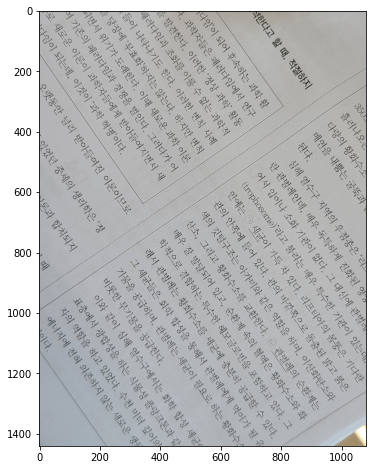

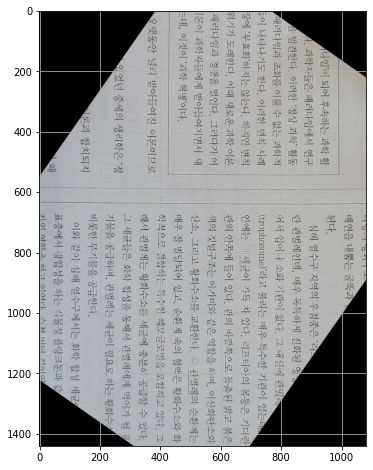

1 60


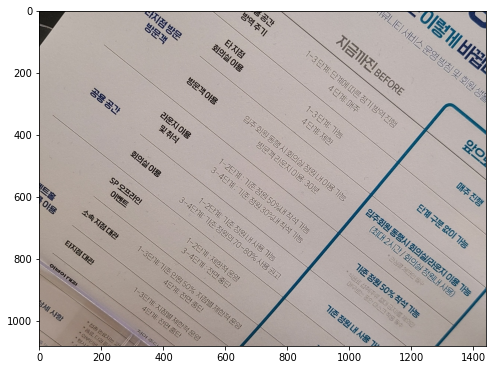

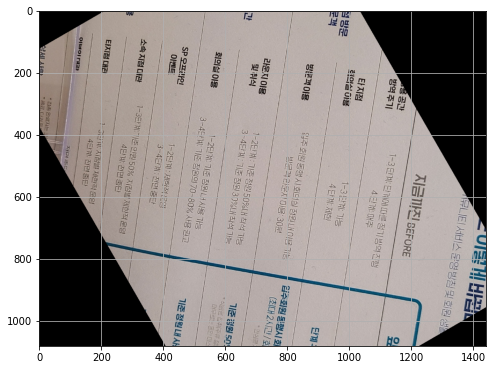

2 28


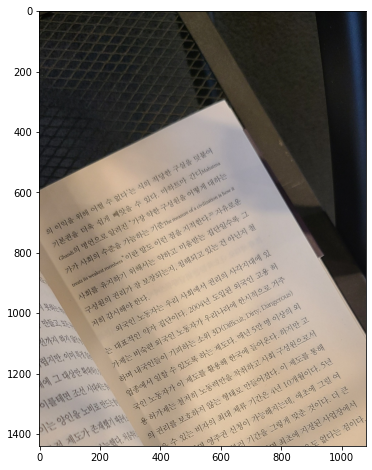

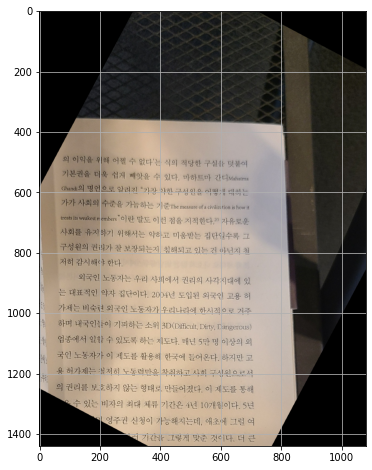

3 248


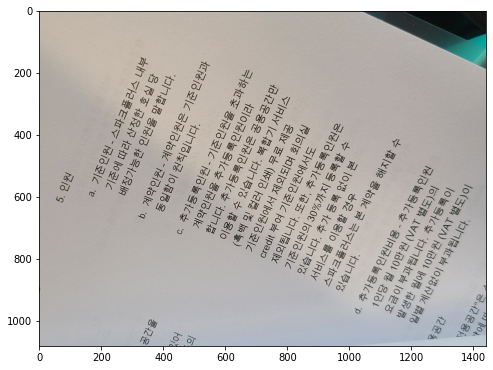

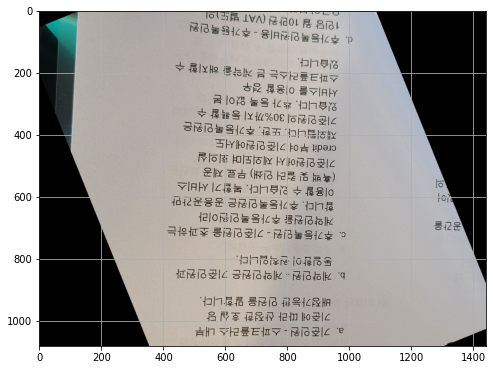

4 203


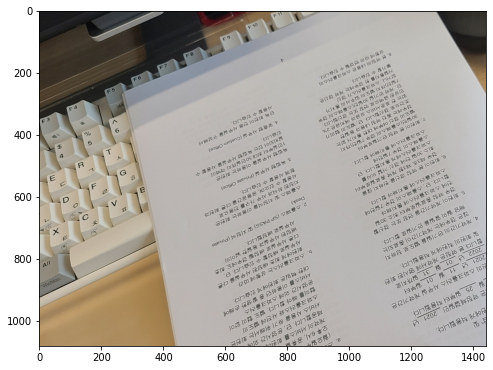

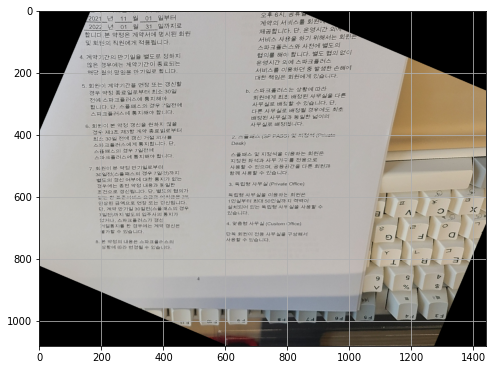

5 139


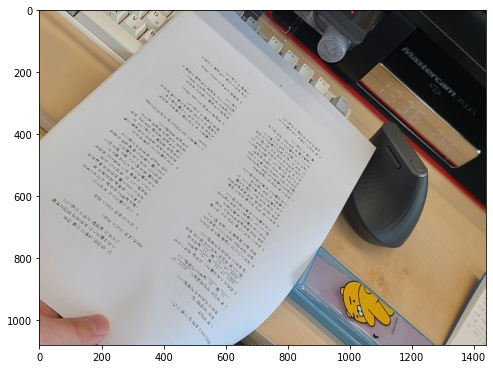

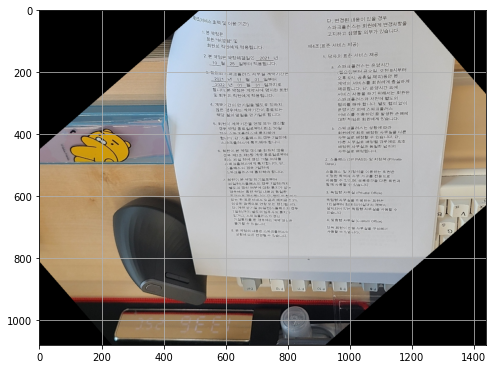

6 195


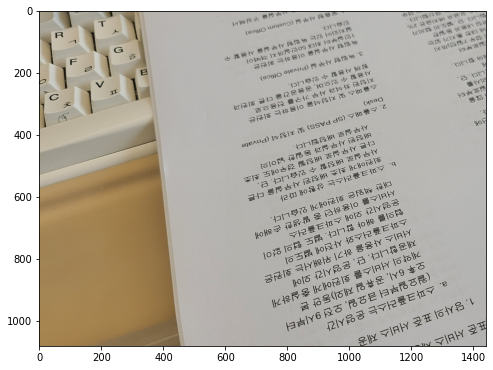

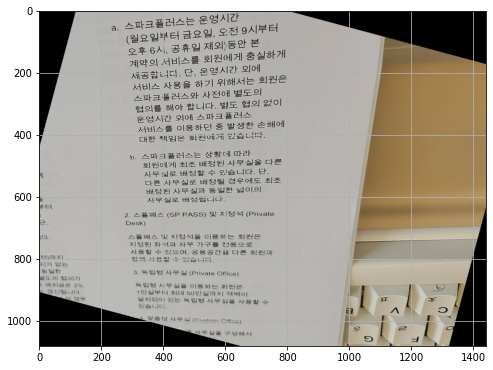

7 346


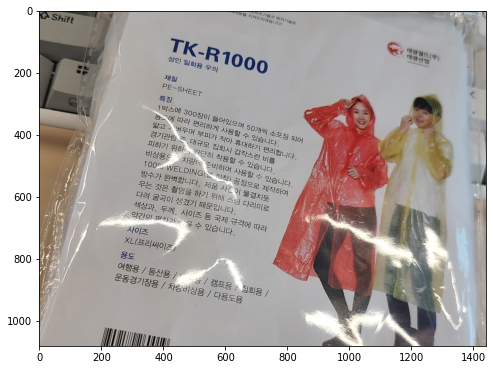

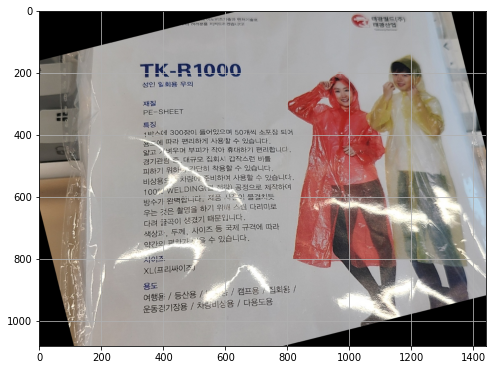

8 333


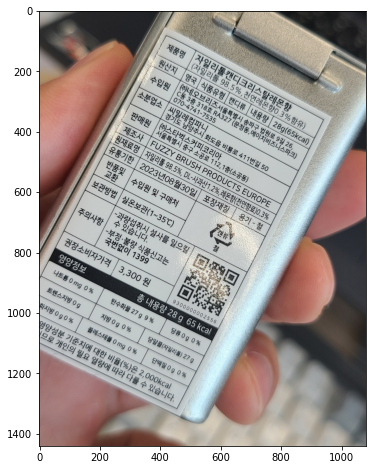

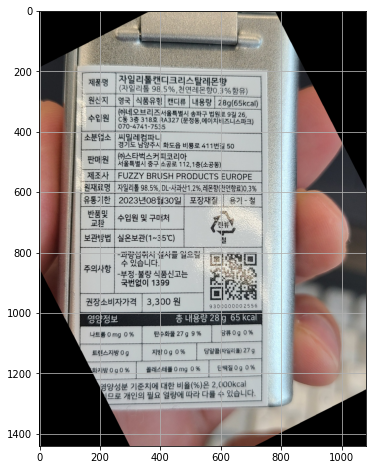

9 254


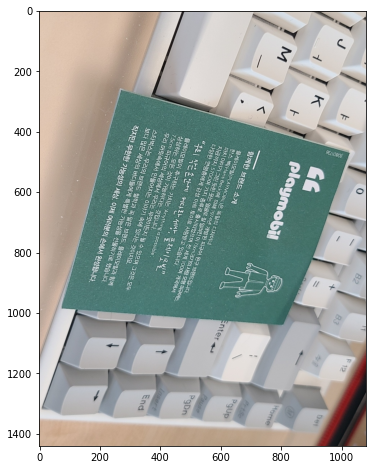

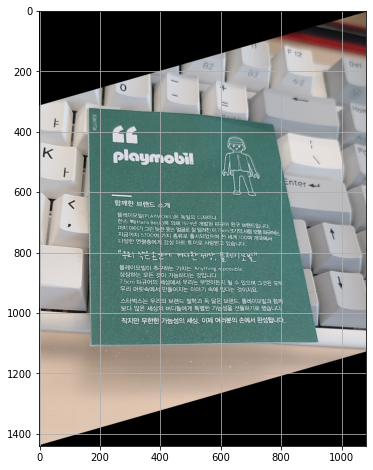

10 254


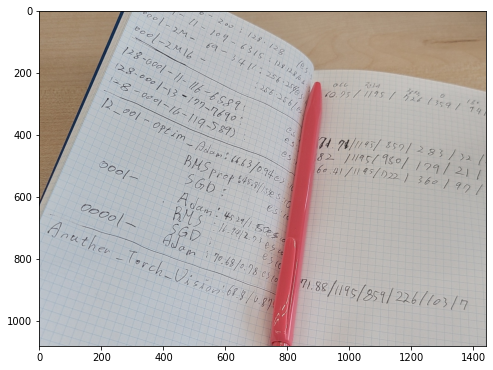

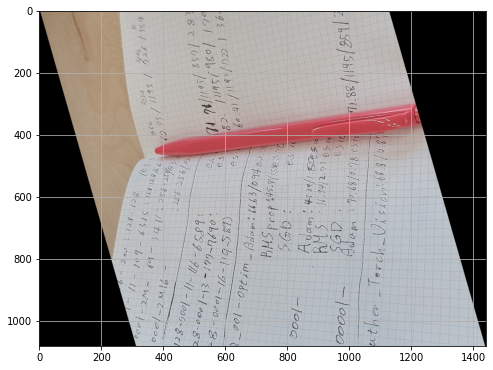

11 14


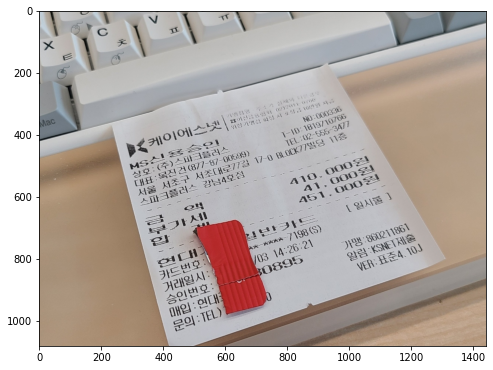

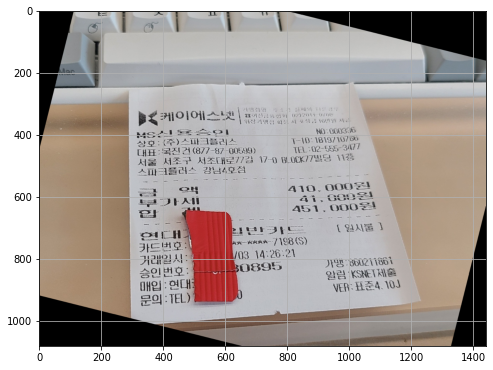

12 296


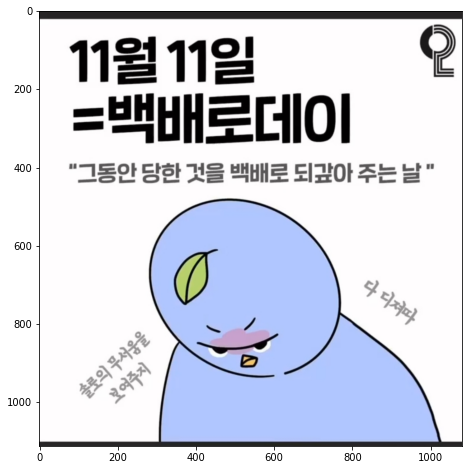

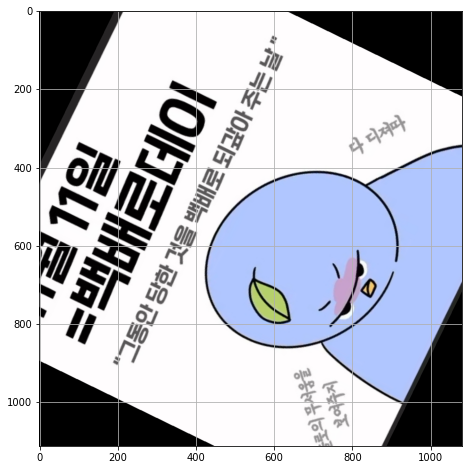

13 272


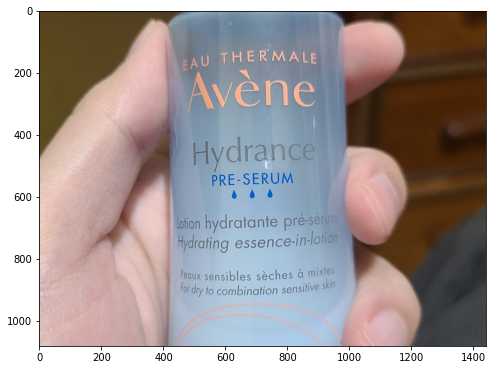

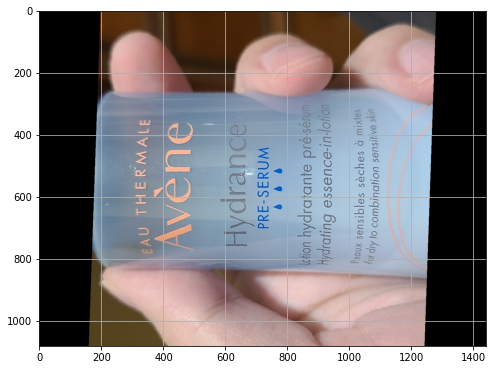

14 257


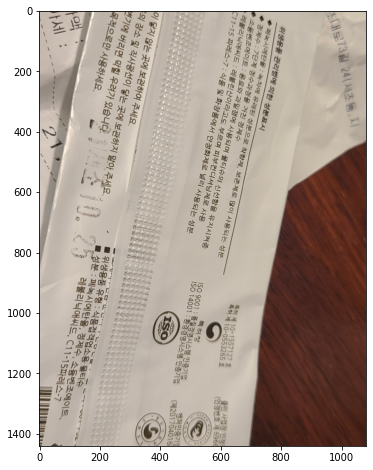

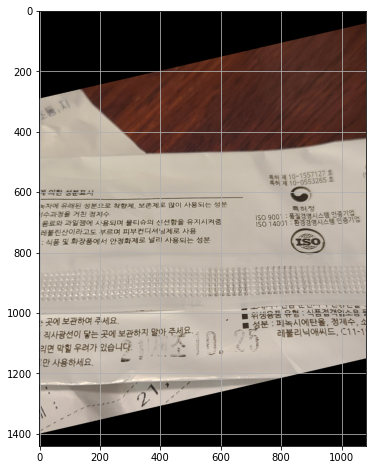

15 331


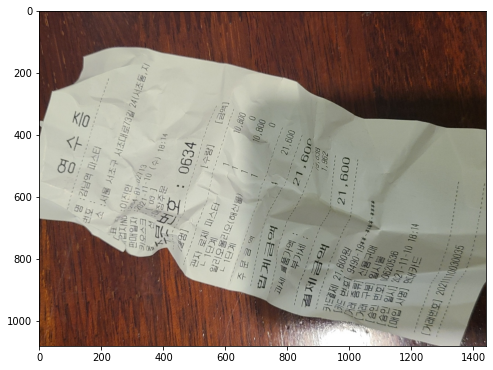

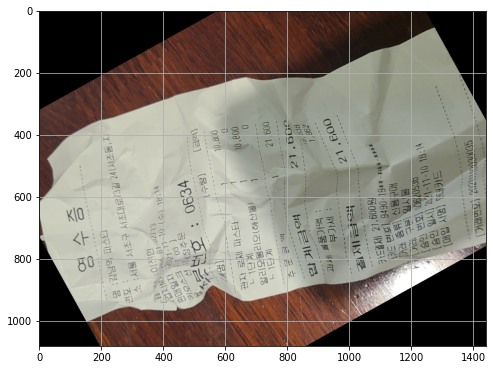

16 92


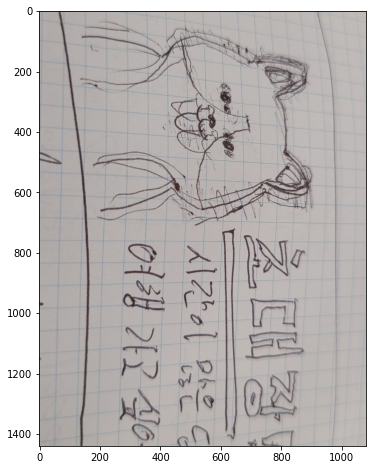

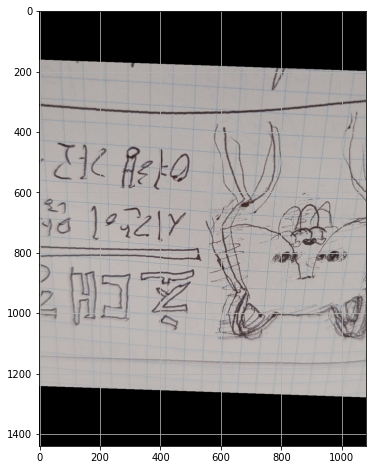

17 66


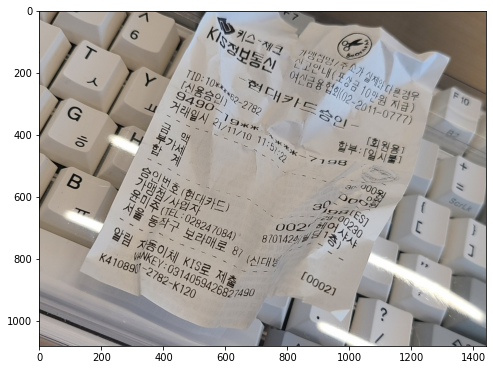

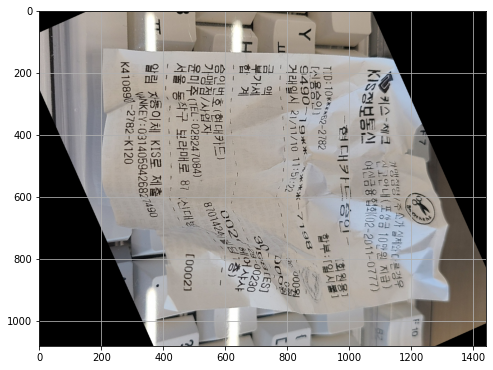

18 212


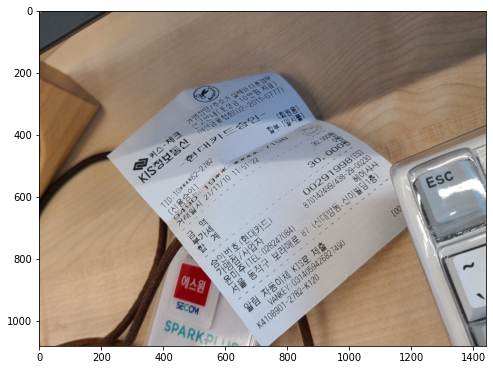

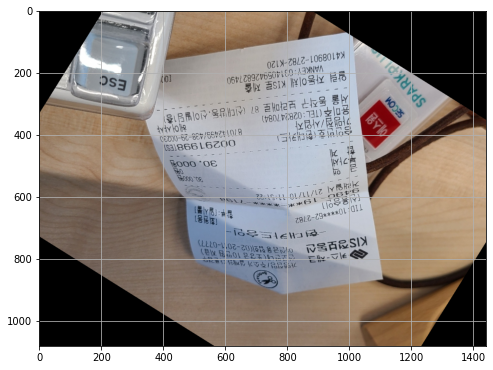

19 325


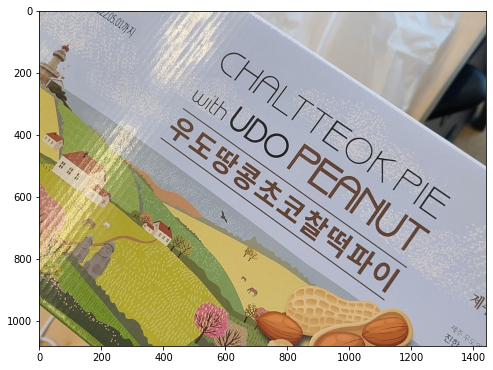

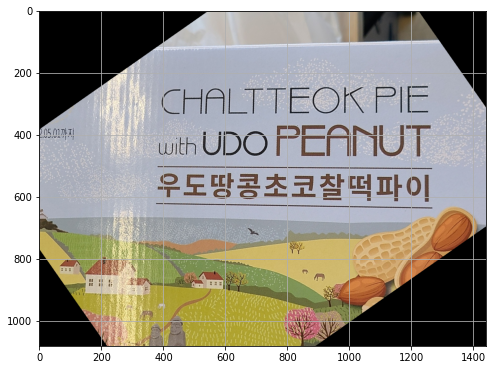

20 329


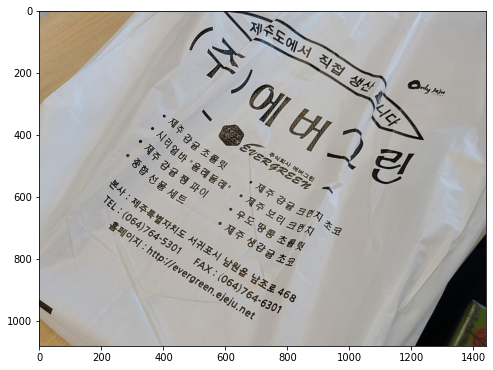

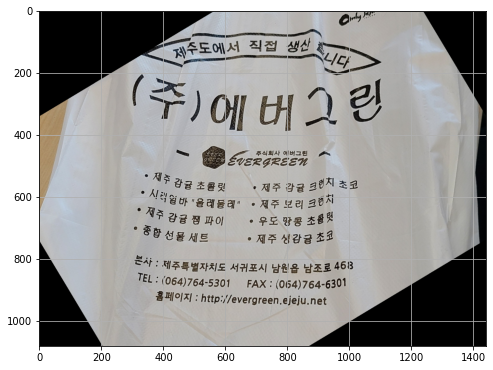

21 66


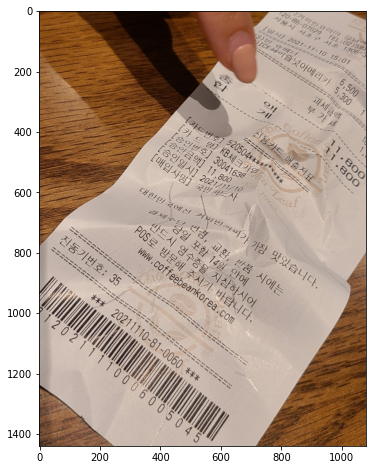

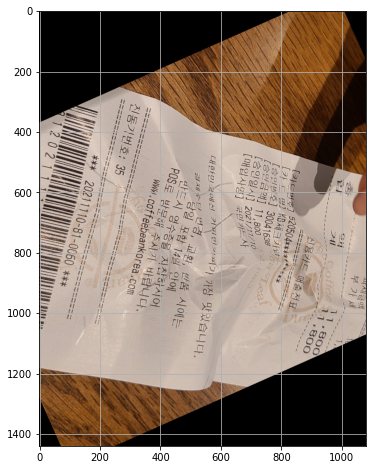

22 355


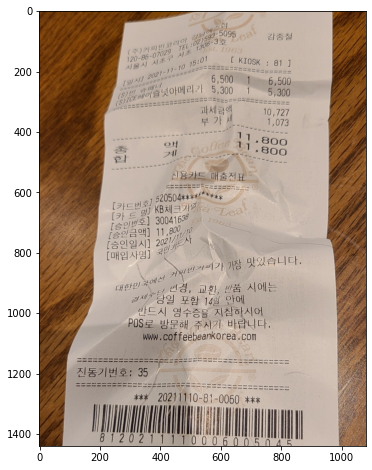

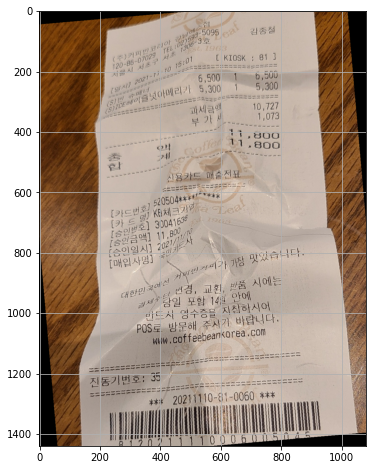

23 43


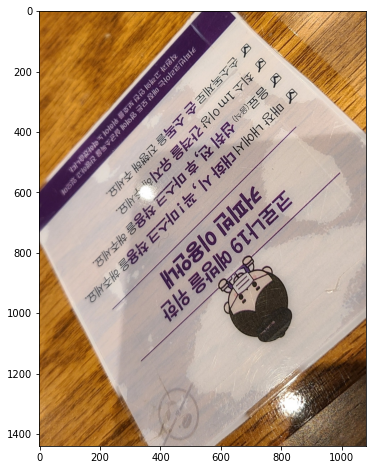

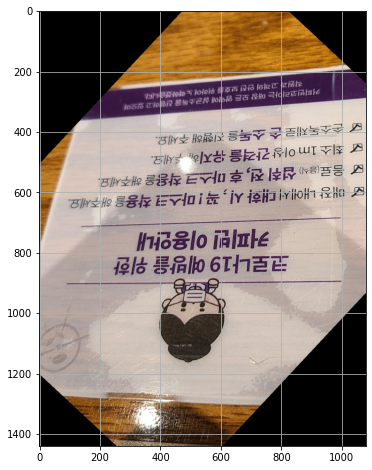

24 313


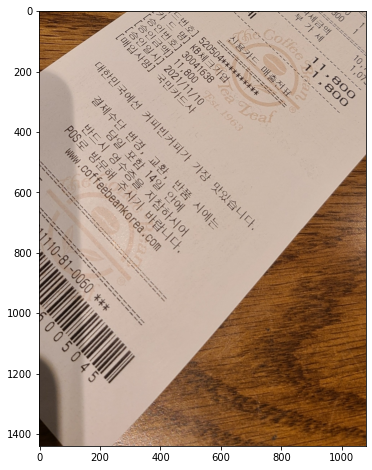

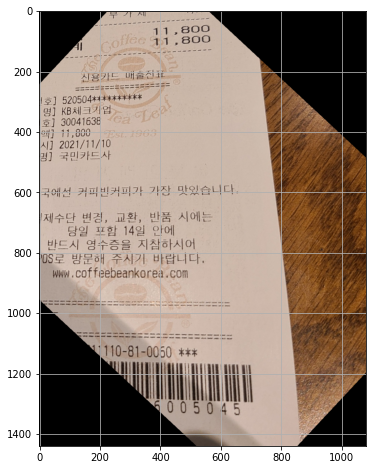

25 181


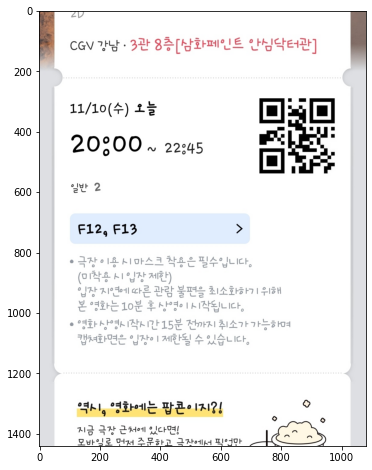

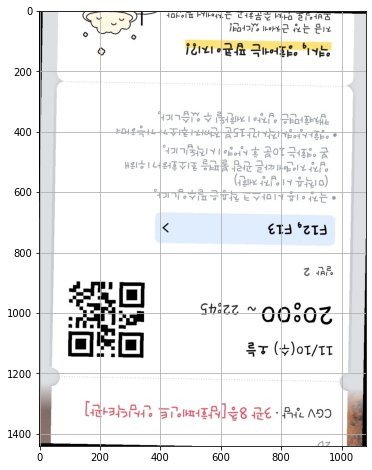

26 283


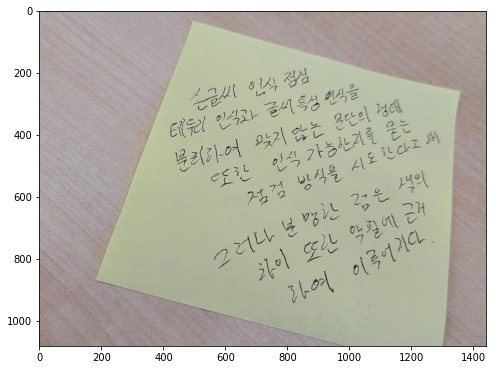

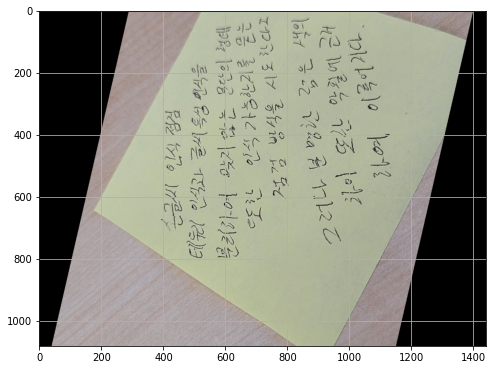

In [36]:
for i, a in enumerate(predicted):
    print(i, a.item())
    img = img_path[i]
    plt.figure(figsize=(8,8))
    plt.imshow(Image.open(img))
    plt.show()
    plt.figure(figsize=(8,8))
    plt.imshow(Image.open(img).rotate(-a.item()))
    plt.grid()
    plt.show()
    
    